TensorFlow 1.x selected.
1.15.2


Using TensorFlow backend.


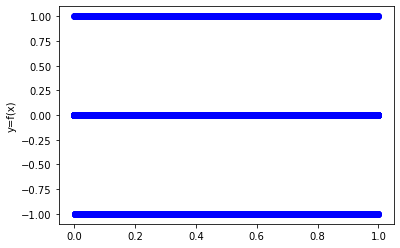

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Train on 10000 samples, validate on 1000 samples
Epoch 1/20
10000/10000 [==============================] - 0s 30us/step - loss: 0.5260 - accuracy: 0.8645 - val_loss: 0.4573 - val_accuracy: 0.8820
Epoch 2/20
10000/10000 [==============================] - 0s 16us/step - loss: 0.4546 - accuracy: 0.8942 - val_loss: 0.4523 - val_accuracy: 0.8820
Epoch 3/20
10000/10000 [==============================] - 0s 18us/step - loss: 0.4392 - accuracy: 0.8942 - val_loss: 0.4519 - val_accuracy: 0.8820
Epoch 4/20
10000/10000 [==============================] - 0s 17us/step - loss: 0.4361 - accuracy: 0.8942 - val_loss: 0.4515 - val_accuracy: 0.8820
Epoch 5/20
10000/10000 [==============================] - 0s 17us/step - loss: 0.4369 - accuracy: 0.8942 - val_loss: 0.4520 - val_accuracy: 0.8820
Epoch 6/20
10000/10000 [==============================] - 0s 16us/step - loss: 0.4334 - accuracy: 0.8942 - val_loss: 0.4514 - val_accu

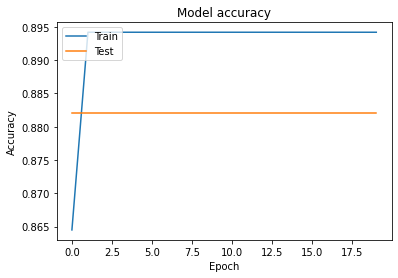

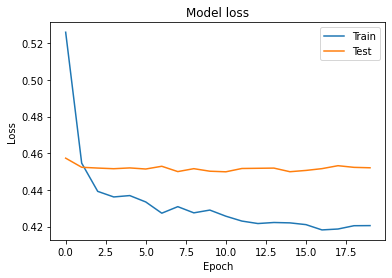

Reusing TensorBoard on port 6006 (pid 5005), started 1:50:41 ago. (Use '!kill 5005' to kill it.)

poids du modele
[array([[ 0.22191736, -0.03241356,  0.09412885, ..., -0.12704445,
        -0.26150724,  0.12193856],
       [ 0.09150198,  0.01276293,  0.21492031, ..., -0.20412907,
         0.11426196, -0.22548988],
       [-0.2547693 , -0.13501869,  0.02993256, ..., -0.1203618 ,
         0.05273968, -0.0778262 ],
       ...,
       [ 0.26400152,  0.05256376, -0.12529176, ..., -0.198289  ,
         0.03937492,  0.09657288],
       [ 0.13881463, -0.25968844,  0.18313166, ...,  0.1317898 ,
         0.21032354,  0.06834382],
       [ 0.1551292 , -0.24866231, -0.14306074, ..., -0.16983189,
        -0.02595191,  0.19072205]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), array([[ 0.11253612, -0.08851582,  0.1913714 , ...,  

'\nfor keys,values in model_dict.items():\n    print(keys)\n    print(values)\n'

In [1]:
#Classificateur complet
'''
Classidfacteur avec TensorFlow et Keras
tous les outils connus de Keras sont utilisés dans ce cas
'''
#necesite Tensor flow 1.15 il fasut le charger sur colab (par default c est le 2.0)
#Restart runtime if neccesary por la classification
%tensorflow_version 1.x
import tensorflow
print(tensorflow.__version__)


%load_ext tensorboard
%reload_ext tensorboard
import tensorflow as tf
import datetime

# Clear any logs from previous runs
!rm -rf ./logs/

# For a single-input model with 2 classes (binary classification):
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout

#Categorisation ou fonction de test
def func_categorisation(x):
  return round(np.median(np.sin(1000*x)))
      
'''
Dataset
sur Keras on a https://keras.io/datasets/
#CIFAR10 small image classification 10 Categories
#Dataset of 50,000 32x32 color training images, labeled over 10 categories, and 10,000 test images.
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

#CIFAR100 small image classification 100 Categories
#Dataset of 50,000 32x32 color training images, labeled over 100 categories, and 10,000 test images.
from keras.datasets import cifar100
(x_train, y_train), (x_test, y_test) = cifar100.load_data(label_mode='fine')

#IMDB Movie reviews sentiment classification
#Dataset of 25,000 movies reviews from IMDB, labeled by sentiment (positive/negative). Reviews have been preprocessed, and each review is encoded as a sequence of word indexes (integers). For convenience, words are indexed by overall frequency in the dataset, so that for instance the integer "3" encodes the 3rd most frequent word in the data. This allows for quick filtering operations such as: "only consider the top 10,000 most common words, but eliminate the top 20 most common words".
from keras.datasets import imdb
(x_train, y_train), (x_test, y_test) = imdb.load_data(path="imdb.npz",
                                                      num_words=None,
                                                      skip_top=0,
                                                      maxlen=None,
                                                      seed=113,
                                                      start_char=1,
                                                      oov_char=2,
                                                      index_from=3)

#Reuters newswire topics classification
#Dataset of 11,228 newswires from Reuters, labeled over 46 topics. As with the IMDB dataset, each wire is encoded as a sequence of word indexes (same conventions).
from keras.datasets import reuters
(x_train, y_train), (x_test, y_test) = reuters.load_data(path="reuters.npz",
                                                         num_words=None,
                                                         skip_top=0,
                                                         maxlen=None,
                                                         test_split=0.2,
                                                         seed=113,
                                                         start_char=1,
                                                         oov_char=2,
                                                         index_from=3)

#MNIST database of handwritten digits
#Dataset of 60,000 28x28 grayscale images of the 10 digits, along with a test set of 10,000 images.
from keras.datasets import mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

#Fashion-MNIST database of fashion articles
#Dataset of 60,000 28x28 grayscale images of 10 fashion categories, along with a test set of 10,000 images. This dataset can be used as a drop-in replacement for MNIST. The class labels are:
from keras.datasets import fashion_mnist
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

#Boston housing price regression dataset
#Samples contain 13 attributes of houses at different locations around the Boston suburbs in the late 1970s. Targets are the median values of the houses at a location (in k$).
from keras.datasets import boston_housing
(x_train, y_train), (x_test, y_test) = boston_housing.load_data()


'''
# Generate dummy data
# En entree 20 parametres en sortie XX
x_train = np.random.random((10000, 20))
y_train = np.asarray([func_categorisation(x_train[i]) for i in range(10000)]) 
x_test = np.random.random((1000, 20))
y_test = np.asarray([func_categorisation(x_test[i]) for i in range(1000)]) 

# Affichage des donnees pour verfier si c est classificable visuellement
import matplotlib.pyplot as plt
plt.plot(x_test, y_test,'bo')
plt.ylabel('y=f(x)')
plt.show()

'''
# Creation du Modele
'''
#Exemple Model sequentiel
model = Sequential()
model.add(Dense(64, input_dim=20, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax'))

#A TESTER/CORRIGER
#Exemple Model Fonctionnel
'''
https://keras.io/models/model/
from keras.models import Model
from keras.layers import Input, Dense

a1 = Input(shape=(32,))
a2 = Input(shape=(32,))
b1 = Dense(32)(a1)
b2 = Dense(32)(a1,a2)
b3 = Dense(32)(a1,a2)

#Model Multifonctionel de dimension n,p
#model = Model(inputs=a1, outputs=b1)
model = Model(inputs=[a1, a2], outputs=[b1, b2, b3])

'''
#visualisation du model
#version image
from keras.utils import plot_model
plot_model(model, to_file='model.png')

from PIL import Image
im = Image.open("model.png")
im.show()

#version svg
from IPython.display import SVG
from keras.utils import model_to_dot
SVG(model_to_dot(model).create(prog='dot', format='svg'))


#partie compilation
# For a multi-class classification problem
'''
Metrics
https://keras.io/metrics/
'''
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Convert labels to categorical one-hot encoding
#mettre le bon numero de classe ici 3
y_train = tf.keras.utils.to_categorical(y_train, num_classes=3)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=3)

'''
# For a binary classification problem
model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# For a mean squared error regression problem
model.compile(optimizer='rmsprop',
              loss='mse')

# For custom metrics
import keras.backend as K

def mean_pred(y_true, y_pred):
    return K.mean(y_pred)
'''

#parametrisation de tensorboard pour la visiualisation
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


#calibration o
history= model.fit(x_train, y_train,
          epochs=20,
          batch_size=128, 
          validation_data=(x_test, y_test),  
          shuffle=False,
          workers=1, use_multiprocessing=False, 
          callbacks=[tensorboard_callback])

#Returns the loss value & metrics values for the model in test mode
score = model.evaluate(x_test, y_test, batch_size=128)
model.summary()

#prediction sur de nouvelles donnees
x_new = np.random.random((1, 20))
y_predicted=model.predict(x_new)
print(x_test)
print(y_predicted)


#Viualisation via l history du model.fit
import matplotlib.pyplot as plt
history_dict = history.history
print(history_dict.keys())

#mettre les valeurs de key des history.history pour les 2 graphs
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()



#affichage du tensor board
%tensorboard --logdir logs/fit

#sauvegarde et chargmenet du model
'''
https://keras.io/models/about-keras-models/#about-keras-models
'''
#seul la structure du model
#en json
from keras.models import model_from_json
json_string = model.to_json()
model = model_from_json(json_string)
#en yaml
from keras.models import model_from_yaml
yaml_string = model.to_yaml()
model = model_from_yaml(yaml_string)

#charger les poids en format hdf5
filepath="logs/models" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
model.save_weights(filepath)
model.load_weights(filepath, by_name=False)

#visualisation du model en normal
print('poids du modele')
print(model.get_weights())

print('config reelle du modele')
model_dict=model.get_config()
model_dict
'''
for keys,values in model_dict.items():
    print(keys)
    print(values)
'''

#Ajout de la calibration du modele avec des nouvelles données



In [3]:
type(plot_model(model))

IPython.core.display.Image

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
TensorFlow version:  2.2.0-rc3


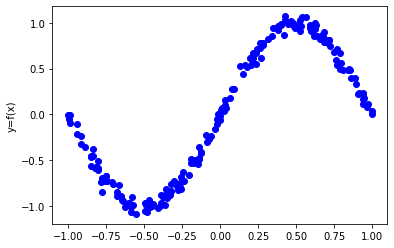

Training ... With default parameters, this takes less than 10 seconds.
Average test loss:  0.20978706061840058


<IPython.core.display.Javascript object>

[[56.787254 ]
 [23.664202 ]
 [ 1.8976263]]


Reusing TensorBoard on port 6007 (pid 4230), started 0:00:04 ago. (Use '!kill 4230' to kill it.)

<IPython.core.display.Javascript object>

[[56.640083 ]
 [23.60287  ]
 [ 1.8927095]]


In [9]:
#Pour l estimation par regression
'''
Estimation de la regression avec Tensorflow Keras
#necesite Tensor flow 2. il est deja chargé sur colab

'''
# Load the TensorBoard notebook extension.
%load_ext tensorboard

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from datetime import datetime
from packaging import version

import tensorflow as tf
from tensorflow import keras

import numpy as np

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."
###########################
data_size = 1000
# 80% of the data is for training.
train_pct = 0.8

train_size = int(data_size * train_pct)

# Create some input data between -1 and 1 and randomize it.
x = np.linspace(-1, 1, data_size)
np.random.shuffle(x)


# Generate the output data.
#Cas a 1 dimension
# y = 0.5x + 2 + noise ou autre
#Categorisation ou fonction de test
def func_categorisation(x):
  return np.sin(np.pi*x)

y = func_categorisation(x) + np.random.normal(0, 0.05, (data_size, ))

#A TESTER/CORRIGER
#Cas a n,p dimension 
'''
dim(x)= n dim(y)=p
# Y = Gamma * X + A + SigmaNoise
def func_categorisation(x):
  return [np.sin(np.pi*np.min(x)),np.sin(np.pi*np.max(x))]

y = func_categorisation(x) + np.random.normal(0, 0.05, (data_size, 2))

'''
# Split into test and train pairs.
x_train, y_train = x[:train_size], y[:train_size]
x_test, y_test = x[train_size:], y[train_size:]
##############################
import matplotlib.pyplot as plt
plt.plot(x_test, y_test,'bo')
plt.ylabel('y=f(x)')
plt.show()
#####

logdir = "logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

model = keras.models.Sequential([
    #A changer input_dim=n pour n,p dimension
    keras.layers.Dense(16, input_dim=1), 
    
    #A changer la dimension finale= p pour n,p dimension
    keras.layers.Dense(1),              
])

model.compile(
    loss='mse', # keras.losses.mean_squared_error
    optimizer=keras.optimizers.SGD(lr=0.2),
)

print("Training ... With default parameters, this takes less than 10 seconds.")
training_history = model.fit(
    x_train, # input
    y_train, # output
    batch_size=train_size,
    verbose=0, # Suppress chatty output; use Tensorboard instead
    epochs=100,
    validation_data=(x_test, y_test),
    callbacks=[tensorboard_callback],
)

print("Average test loss: ", np.average(training_history.history['loss']))
%tensorboard --logdir logs/scalars
#############################
print(model.predict([60, 25, 2]))
# True values to compare predictions against: 
# [[32.0]
#  [14.5]
#  [ 3.0]]
#############################
'''
Logging custom scalars
What if you want to log custom values, such as a dynamic learning rate? To do that, you need to use the TensorFlow Summary API.

Retrain the regression model and log a custom learning rate. Here's how:

Create a file writer, using tf.summary.create_file_writer().
Define a custom learning rate function. This will be passed to the Keras LearningRateScheduler callback.
Inside the learning rate function, use tf.summary.scalar() to log the custom learning rate.
Pass the LearningRateScheduler callback to Model.fit().
In general, to log a custom scalar, you need to use tf.summary.scalar() with a file writer. The file writer is responsible for writing data for this run to the specified directory and is implicitly used when you use the tf.summary.scalar().


'''
logdir = "logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
file_writer = tf.summary.create_file_writer(logdir + "/metrics")
file_writer.set_as_default()

def lr_schedule(epoch):
  """
  Returns a custom learning rate that decreases as epochs progress.
  """
  learning_rate = 0.2
  if epoch > 10:
    learning_rate = 0.02
  if epoch > 20:
    learning_rate = 0.01
  if epoch > 50:
    learning_rate = 0.005

  tf.summary.scalar('learning rate', data=learning_rate, step=epoch)
  return learning_rate

lr_callback = keras.callbacks.LearningRateScheduler(lr_schedule)
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

model = keras.models.Sequential([
    keras.layers.Dense(16, input_dim=1),
    keras.layers.Dense(1),
])

model.compile(
    loss='mse', # keras.losses.mean_squared_error
    optimizer=keras.optimizers.SGD(),
)

training_history = model.fit(
    x_train, # input
    y_train, # output
    batch_size=train_size,
    verbose=0, # Suppress chatty output; use Tensorboard instead
    epochs=100,
    validation_data=(x_test, y_test),
    callbacks=[tensorboard_callback, lr_callback],
)
#####################################

%tensorboard --logdir logs/scalars
print(model.predict([60, 25, 2]))
# True values to compare predictions against: 
# [[32.0]
#  [14.5]
#  [ 3.0]]



In [0]:
#using Tensorflow et Tensorboard sans passer par Keras mais avec le gradient
'''
#using tensorbord sans passer par Keras masi avec le gradient
https://www.tensorflow.org/tensorboard/get_started

'''
#Dataset
import tensorflow as tf
import datetime
%load_ext tensorboard
%reload_ext tensorboard


# Clear any logs from previous runs
!rm -rf ./logs/

# For a single-input model with 2 classes (binary classification):
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout

mnist = tf.keras.datasets.mnist

(x_train, y_train),(x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))

train_dataset = train_dataset.shuffle(60000).batch(64)
test_dataset = test_dataset.batch(64)

#Model simple
def create_model():
  return tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation='softmax')
  ])

#Definir loss et l´optimiseur
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam()

# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')
test_loss = tf.keras.metrics.Mean('test_loss', dtype=tf.float32)
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('test_accuracy')

#Definir le training et le test
def train_step(model, optimizer, x_train, y_train):
  with tf.GradientTape() as tape:
    predictions = model(x_train, training=True)
    loss = loss_object(y_train, predictions)
  grads = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  train_loss(loss)
  train_accuracy(y_train, predictions)

def test_step(model, x_test, y_test):
  predictions = model(x_test)
  loss = loss_object(y_test, predictions)

  test_loss(loss)
  test_accuracy(y_test, predictions)

#ecriture du resultat des etapes intermediaires du training
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

#Debut de l entrainemement avec tf.summary.scalar()
model = create_model() # reset our model

EPOCHS = 5

for epoch in range(EPOCHS):
  for (x_train, y_train) in train_dataset:
    train_step(model, optimizer, x_train, y_train)
  with train_summary_writer.as_default():
    tf.summary.scalar('loss', train_loss.result(), step=epoch)
    tf.summary.scalar('accuracy', train_accuracy.result(), step=epoch)

  for (x_test, y_test) in test_dataset:
    test_step(model, x_test, y_test)
  with test_summary_writer.as_default():
    tf.summary.scalar('loss', test_loss.result(), step=epoch)
    tf.summary.scalar('accuracy', test_accuracy.result(), step=epoch)
  
  template = 'Epoch {}, Loss: {}, Accuracy: {}, Test Loss: {}, Test Accuracy: {}'
  print (template.format(epoch+1,
                         train_loss.result(), 
                         train_accuracy.result()*100,
                         test_loss.result(), 
                         test_accuracy.result()*100))

  # Reset metrics every epoch
  train_loss.reset_states()
  test_loss.reset_states()
  train_accuracy.reset_states()
  test_accuracy.reset_states()

  #Visualisation sur TensorBoard
  %tensorboard --logdir logs/gradient_tape

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Epoch 1, Loss: 0.24514593183994293, Accuracy: 92.86333465576172, Test Loss: 0.11559043079614639, Test Accuracy: 96.69000244140625


Reusing TensorBoard on port 6006 (pid 1369), started 0:15:12 ago. (Use '!kill 1369' to kill it.)

<IPython.core.display.Javascript object>

Epoch 2, Loss: 0.10488729923963547, Accuracy: 96.90166473388672, Test Loss: 0.0895216166973114, Test Accuracy: 97.36000061035156


Reusing TensorBoard on port 6006 (pid 1369), started 0:15:25 ago. (Use '!kill 1369' to kill it.)

<IPython.core.display.Javascript object>

Epoch 3, Loss: 0.07359036058187485, Accuracy: 97.74500274658203, Test Loss: 0.07484754920005798, Test Accuracy: 97.68000030517578


Reusing TensorBoard on port 6006 (pid 1369), started 0:15:37 ago. (Use '!kill 1369' to kill it.)

<IPython.core.display.Javascript object>

Epoch 4, Loss: 0.05502203106880188, Accuracy: 98.2750015258789, Test Loss: 0.06319612264633179, Test Accuracy: 98.0


Reusing TensorBoard on port 6006 (pid 1369), started 0:15:51 ago. (Use '!kill 1369' to kill it.)

<IPython.core.display.Javascript object>

Epoch 5, Loss: 0.04346086084842682, Accuracy: 98.61666870117188, Test Loss: 0.06422162801027298, Test Accuracy: 97.97000122070312


Reusing TensorBoard on port 6006 (pid 1369), started 0:16:03 ago. (Use '!kill 1369' to kill it.)

<IPython.core.display.Javascript object>

13574144/13568290 [==============================] - 0s 0us/step
Single window of past history
[[-1.99766294]
 [-2.04281897]
 [-2.05439744]
 [-2.0312405 ]
 [-2.02660912]
 [-2.00113649]
 [-1.95134907]
 [-1.95134907]
 [-1.98492663]
 [-2.04513467]
 [-2.08334362]
 [-2.09723778]
 [-2.09376424]
 [-2.09144854]
 [-2.07176515]
 [-2.07176515]
 [-2.07639653]
 [-2.08913285]
 [-2.09260639]
 [-2.10418486]]

 Target temperature to predict
-2.1041848598100876
(256, 1)
Epoch 1/10
200/200 [==============================] - 2s 11ms/step - loss: 0.4075 - val_loss: 0.1351
Epoch 2/10
200/200 [==============================] - 2s 9ms/step - loss: 0.1118 - val_loss: 0.0359
Epoch 3/10
200/200 [==============================] - 2s 9ms/step - loss: 0.0489 - val_loss: 0.0290
Epoch 4/10
200/200 [==============================] - 2s 9ms/step - loss: 0.0443 - val_loss: 0.0258
Epoch 5/10
200/200 [==============================] - 2s 9ms/step - loss: 0.0299 - val_loss: 0.0235
Epoch 6/10
200/200 [======================

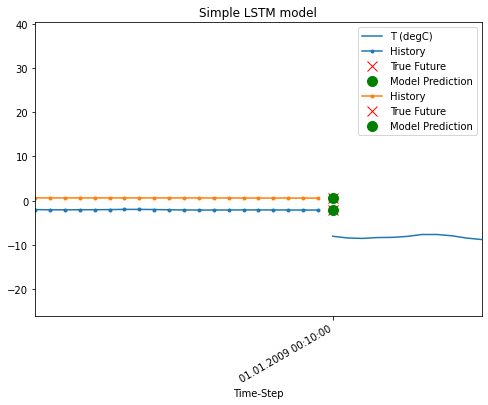

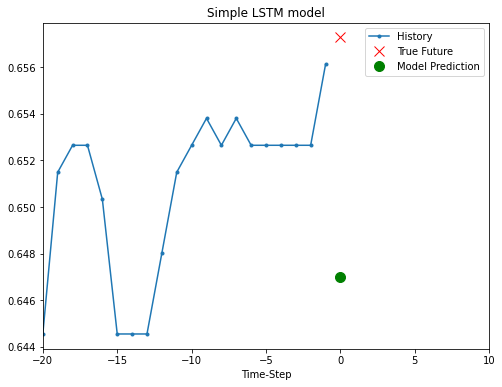

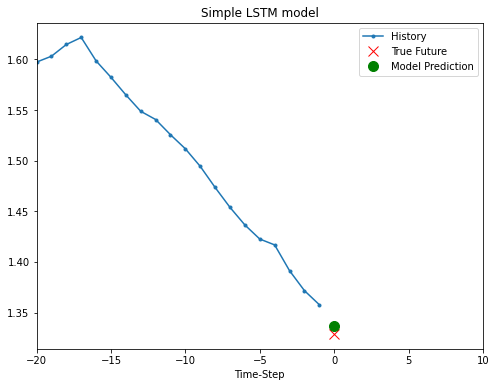

Single window of past history : (120, 3)
(256, 1)
Epoch 1/10
200/200 [==============================] - 20s 102ms/step - loss: 0.3090 - val_loss: 0.2647
Epoch 2/10
200/200 [==============================] - 18s 90ms/step - loss: 0.2623 - val_loss: 0.2421
Epoch 3/10
200/200 [==============================] - 18s 90ms/step - loss: 0.2611 - val_loss: 0.2448
Epoch 4/10
200/200 [==============================] - 19s 93ms/step - loss: 0.2568 - val_loss: 0.2447
Epoch 5/10
200/200 [==============================] - 19s 95ms/step - loss: 0.2260 - val_loss: 0.2368
Epoch 6/10
200/200 [==============================] - 18s 92ms/step - loss: 0.2412 - val_loss: 0.2658
Epoch 7/10
200/200 [==============================] - 19s 96ms/step - loss: 0.2413 - val_loss: 0.2565
Epoch 8/10
200/200 [==============================] - 19s 96ms/step - loss: 0.2406 - val_loss: 0.2381
Epoch 9/10
200/200 [==============================] - 19s 96ms/step - loss: 0.2451 - val_loss: 0.2480
Epoch 10/10
200/200 [==========

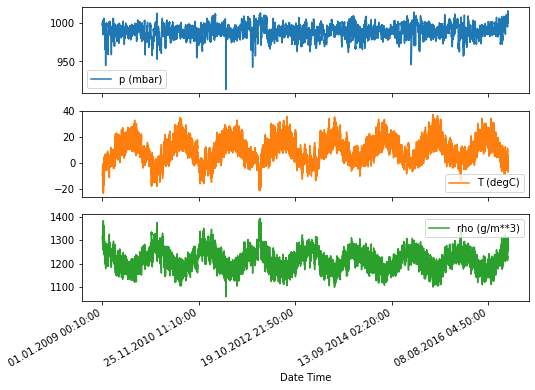

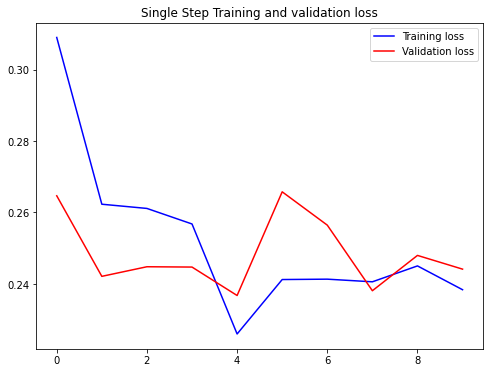

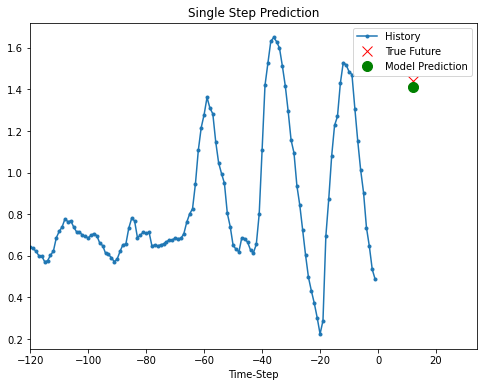

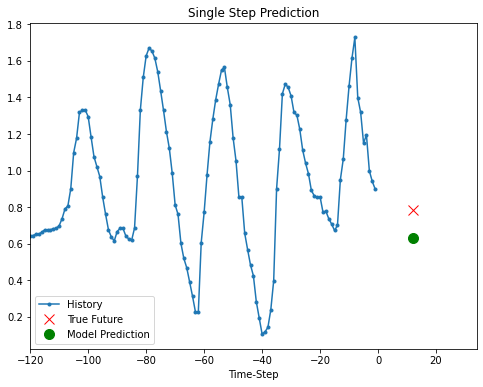

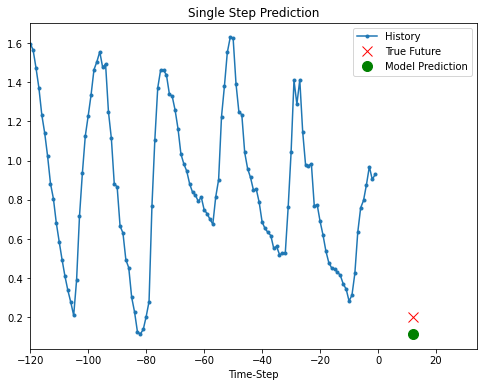

Single window of past history : (120, 3)

 Target temperature to predict : (72,)


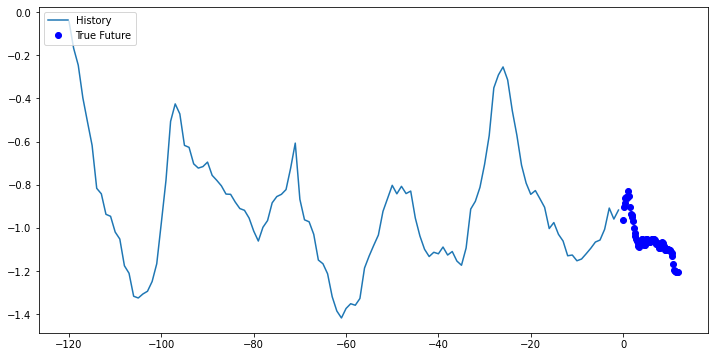

(256, 72)
Epoch 1/10
200/200 [==============================] - 33s 165ms/step - loss: 0.4949 - val_loss: 0.3073
Epoch 2/10
200/200 [==============================] - 32s 162ms/step - loss: 0.3465 - val_loss: 0.2871
Epoch 3/10
200/200 [==============================] - 34s 171ms/step - loss: 0.3290 - val_loss: 0.2466
Epoch 4/10
200/200 [==============================] - 35s 176ms/step - loss: 0.2431 - val_loss: 0.2092
Epoch 5/10
200/200 [==============================] - 35s 173ms/step - loss: 0.1977 - val_loss: 0.1996
Epoch 6/10
200/200 [==============================] - 34s 170ms/step - loss: 0.2077 - val_loss: 0.2083
Epoch 7/10
200/200 [==============================] - 35s 173ms/step - loss: 0.1990 - val_loss: 0.2074
Epoch 8/10
200/200 [==============================] - 34s 171ms/step - loss: 0.1956 - val_loss: 0.1965
Epoch 9/10
200/200 [==============================] - 34s 172ms/step - loss: 0.1976 - val_loss: 0.1914
Epoch 10/10
200/200 [==============================] - 35s 176m

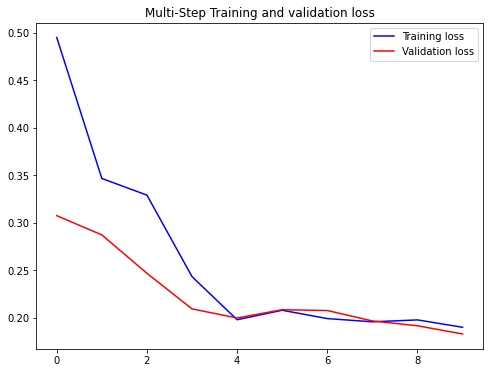

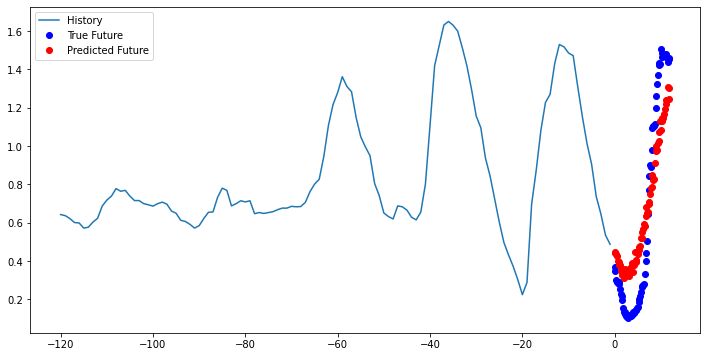

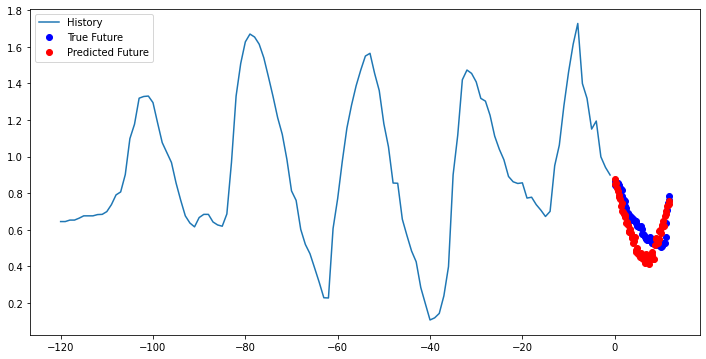

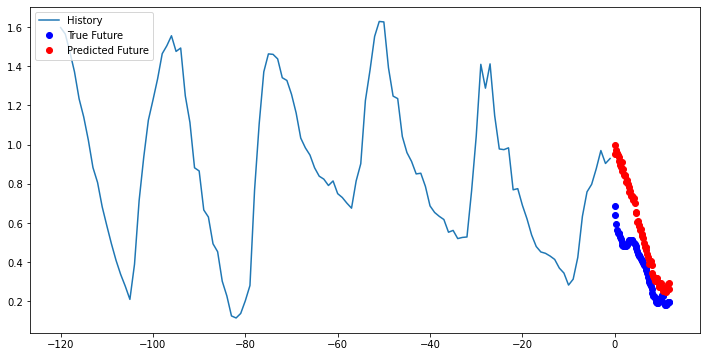

In [10]:
'''
Time serie Forcasting avec Tensorflow
avec un RNN en univariate et multivariate
https://www.tensorflow.org/tutorials/structured_data/time_series
'''
import tensorflow as tf

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False


'''
Dataset 
The weather dataset
This tutorial uses a [weather time series dataset recorded by the Max Planck Institute for Biogeochemistry.
'''
zip_path = tf.keras.utils.get_file(
    origin='https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip',
    fname='jena_climate_2009_2016.csv.zip',
    extract=True)
csv_path, _ = os.path.splitext(zip_path)

df = pd.read_csv(csv_path)
df.head()

#Pour une serie de dimension 1
def univariate_data(dataset, start_index, end_index, history_size, target_size):
  '''
  The function below returns the above described windows of time for the model to train on. 
  The parameter history_size is the size of the past window of information. 
  The target_size is how far in the future does the model need to learn to predict. 
  The target_size is the label that needs to be predicted.

  '''
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i)
    # Reshape data from (history_size,) to (history_size, 1)
    data.append(np.reshape(dataset[indices], (history_size, 1)))
    labels.append(dataset[i+target_size])
  return np.array(data), np.array(labels)

#first 30 000 raws are the training set
TRAIN_SPLIT = 300000
#set seed to ensure reprodcibilty
tf.random.set_seed(13)

#Ici on prend une dimension 1 : Temperature
uni_data = df['T (degC)']
uni_data.index = df['Date Time']
uni_data.head()

uni_data.plot(subplots=True)
uni_data = uni_data.values


#IMPORTANT ON NORMALISE LES DONNEES AVEC LA MOYENNE ET LA VAR
uni_train_mean = uni_data[:TRAIN_SPLIT].mean()
uni_train_std = uni_data[:TRAIN_SPLIT].std()
uni_data = (uni_data-uni_train_mean)/uni_train_std

#donnees pour le passé et le futur
univariate_past_history = 20
univariate_future_target = 0

x_train_uni, y_train_uni = univariate_data(uni_data, 0, TRAIN_SPLIT,
                                           univariate_past_history,
                                           univariate_future_target)
x_val_uni, y_val_uni = univariate_data(uni_data, TRAIN_SPLIT, None,
                                       univariate_past_history,
                                       univariate_future_target)

'''
Fin de dataset 1
Debut Mise en place de la visualiation 
'''
print ('Single window of past history')
print (x_train_uni[0])
print ('\n Target temperature to predict')
print (y_train_uni[0])

def create_time_steps(length):
  return list(range(-length, 0))

def baseline(history):
  return np.mean(history)

def show_plot(plot_data, delta, title):
  labels = ['History', 'True Future', 'Model Prediction']
  marker = ['.-', 'rx', 'go']
  time_steps = create_time_steps(plot_data[0].shape[0])
  if delta:
    future = delta
  else:
    future = 0

  plt.title(title)
  for i, x in enumerate(plot_data):
    if i:
      plt.plot(future, plot_data[i], marker[i], markersize=10,
               label=labels[i])
    else:
      plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
  plt.legend()
  plt.xlim([time_steps[0], (future+5)*2])
  plt.xlabel('Time-Step')
  return plt

show_plot([x_train_uni[0], y_train_uni[0], baseline(x_train_uni[0])], 0,
           'Baseline Prediction Example')

'''
Debut Model RNN 
Times serie step by step 
ici LSTM voir aussi pour plus de cas 
https://www.tensorflow.org/tutorials/text/text_generation
'''
BATCH_SIZE = 256
BUFFER_SIZE = 10000

#Decoupage du dataset come un rectangle de : Batchsize x Time Step x Features
train_univariate = tf.data.Dataset.from_tensor_slices((x_train_uni, y_train_uni))
train_univariate = train_univariate.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_univariate = tf.data.Dataset.from_tensor_slices((x_val_uni, y_val_uni))
val_univariate = val_univariate.batch(BATCH_SIZE).repeat()

#Model creation
simple_lstm_model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(8, input_shape=x_train_uni.shape[-2:]),
    tf.keras.layers.Dense(1)
])

#Model compilation
simple_lstm_model.compile(optimizer='adam', loss='mae')

#CHECK MODEL avec une  prediction just to check la taille du resultat 
for x, y in val_univariate.take(1):
    print(simple_lstm_model.predict(x).shape)

#FIT du model
EVALUATION_INTERVAL = 200
EPOCHS = 10

simple_lstm_model.fit(train_univariate, epochs=EPOCHS,
                      steps_per_epoch=EVALUATION_INTERVAL,
                      validation_data=val_univariate, validation_steps=50)

#PREDICT DU MODEL Calibré pour 3 dates
for x, y in val_univariate.take(3):
  plot = show_plot([x[0].numpy(), y[0].numpy(),
                    simple_lstm_model.predict(x)[0]], 0, 'Simple LSTM model')
  plot.show()

#Fin de la dimension 1 

#Debut pour N dimension
#On prend 3 dimensions N : Temperature Pression et densité de l air

features_considered = ['p (mbar)', 'T (degC)', 'rho (g/m**3)']
features = df[features_considered]
features.index = df['Date Time']
features.head()

features.plot(subplots=True)

#Prise du nouveau dataset et normalisation des données
dataset = features.values
data_mean = dataset[:TRAIN_SPLIT].mean(axis=0)
data_std = dataset[:TRAIN_SPLIT].std(axis=0)
dataset = (dataset-data_mean)/data_std

#debut de l estimation de 1 SEUL POINT dans le Future
def multivariate_data(dataset, target, start_index, end_index, history_size,
                      target_size, step, single_step=False):
  data = []
  labels = []

  start_index = start_index + history_size
  if end_index is None:
    end_index = len(dataset) - target_size

  for i in range(start_index, end_index):
    indices = range(i-history_size, i, step)
    data.append(dataset[indices])

    if single_step:
      labels.append(target[i+target_size])
    else:
      labels.append(target[i:i+target_size])

  return np.array(data), np.array(labels)

#pour le passé on prend les 5 derniers jours avec une observation par heure 120 donnees
#pour le futur on prend on la temperature apres 12heures 72
past_history = 720
future_target = 72
STEP = 6

x_train_single, y_train_single = multivariate_data(dataset, dataset[:, 1], 0,
                                                   TRAIN_SPLIT, past_history,
                                                   future_target, STEP,
                                                   single_step=True)
x_val_single, y_val_single = multivariate_data(dataset, dataset[:, 1],
                                               TRAIN_SPLIT, None, past_history,
                                               future_target, STEP,
                                               single_step=True)

print ('Single window of past history : {}'.format(x_train_single[0].shape))

#traitement des donnees
train_data_single = tf.data.Dataset.from_tensor_slices((x_train_single, y_train_single))
train_data_single = train_data_single.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_single = tf.data.Dataset.from_tensor_slices((x_val_single, y_val_single))
val_data_single = val_data_single.batch(BATCH_SIZE).repeat()

#creation du modele et compilation
single_step_model = tf.keras.models.Sequential()
single_step_model.add(tf.keras.layers.LSTM(32,
                                           input_shape=x_train_single.shape[-2:]))
single_step_model.add(tf.keras.layers.Dense(1))

single_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='mae')

#Check de la predicyion sans le fit pour voir la dimension du resultat
for x, y in val_data_single.take(1):
  print(single_step_model.predict(x).shape)


#Fit ou optimisation des donnees
single_step_history = single_step_model.fit(train_data_single, epochs=EPOCHS,
                                            steps_per_epoch=EVALUATION_INTERVAL,
                                            validation_data=val_data_single,
                                            validation_steps=50)

#Visualisation de l´optimisation
def plot_train_history(history, title):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(loss))

  plt.figure()

  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title(title)
  plt.legend()

  plt.show()

plot_train_history(single_step_history, 'Single Step Training and validation loss')

#Prediction d´une etape dans le future pour 3 cas
for x, y in val_data_single.take(3):
  plot = show_plot([x[0][:, 1].numpy(), y[0].numpy(),
                    single_step_model.predict(x)[0]], 12,
                   'Single Step Prediction')
  plot.show()

#Fin de l estimation de 1 SEUL POINT dans le Future
#Fin de l estimation de N POINTs dans le Future
#Ici la temperature dans les 12 prochaines heures
#ON prend 6 donnees par heures soit 72 donnes
future_target = 72
x_train_multi, y_train_multi = multivariate_data(dataset, dataset[:, 1], 0,
                                                 TRAIN_SPLIT, past_history,
                                                 future_target, STEP)
x_val_multi, y_val_multi = multivariate_data(dataset, dataset[:, 1],
                                             TRAIN_SPLIT, None, past_history,
                                             future_target, STEP)

print ('Single window of past history : {}'.format(x_train_multi[0].shape))
print ('\n Target temperature to predict : {}'.format(y_train_multi[0].shape))

#shuffle du dataset
train_data_multi = tf.data.Dataset.from_tensor_slices((x_train_multi, y_train_multi))
train_data_multi = train_data_multi.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()

val_data_multi = tf.data.Dataset.from_tensor_slices((x_val_multi, y_val_multi))
val_data_multi = val_data_multi.batch(BATCH_SIZE).repeat()

#graph por un seul cas
def multi_step_plot(history, true_future, prediction):
  plt.figure(figsize=(12, 6))
  num_in = create_time_steps(len(history))
  num_out = len(true_future)

  plt.plot(num_in, np.array(history[:, 1]), label='History')
  plt.plot(np.arange(num_out)/STEP, np.array(true_future), 'bo',
           label='True Future')
  if prediction.any():
    plt.plot(np.arange(num_out)/STEP, np.array(prediction), 'ro',
             label='Predicted Future')
  plt.legend(loc='upper left')
  plt.show()

for x, y in train_data_multi.take(1):
  multi_step_plot(x[0], y[0], np.array([0]))

#construction du modele et sa compilation
#ici on prend 2 couches de LSTM 
#la dernieres couche donne 72 predcition
multi_step_model = tf.keras.models.Sequential()
multi_step_model.add(tf.keras.layers.LSTM(32,
                                          return_sequences=True,
                                          input_shape=x_train_multi.shape[-2:]))
multi_step_model.add(tf.keras.layers.LSTM(16, activation='relu'))
multi_step_model.add(tf.keras.layers.Dense(72))

multi_step_model.compile(optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0), loss='mae')

#check de la taille du resultat
for x, y in val_data_multi.take(1):
  print (multi_step_model.predict(x).shape)

#Fit du modele avec les donnees
multi_step_history = multi_step_model.fit(train_data_multi, epochs=EPOCHS,
                                          steps_per_epoch=EVALUATION_INTERVAL,
                                          validation_data=val_data_multi,
                                          validation_steps=50)

#Affichage du loss para epoch et 
plot_train_history(multi_step_history, 'Multi-Step Training and validation loss')

#Graf de prediction de 3 cas au hasard
for x, y in val_data_multi.take(3):
  multi_step_plot(x[0], y[0], multi_step_model.predict(x)[0])

In [0]:
''''
Projet marché Financiers
1. Classification de létat du marché RELU Dense etc
2. Prediction de differntes dates du marché RNN LTSM
3. Maximisation des Gains RL

Voir une partie Bayesienne
Generative NN pour faire une augmentation des donnees (equivalent de scenarios de marché)

''''

In [0]:
'''
Exemple sur Keras a TESTER
https://github.com/keras-team/keras/tree/master/examples
https://keras.io/getting-started/sequential-model-guide/#compilation

'''
#ICI RNN mais il en a bp plus LSTM etc
from keras.models import Sequential
from keras.layers import LSTM, Dense
import numpy as np

data_dim = 16
timesteps = 8
num_classes = 10
batch_size = 32

# Expected input batch shape: (batch_size, timesteps, data_dim)
# Note that we have to provide the full batch_input_shape since the network is stateful.
# the sample of index i in batch k is the follow-up for the sample i in batch k-1.
model = Sequential()
model.add(LSTM(32, return_sequences=True, stateful=True,
               batch_input_shape=(batch_size, timesteps, data_dim)))
model.add(LSTM(32, return_sequences=True, stateful=True))
model.add(LSTM(32, stateful=True))
model.add(Dense(10, activation='softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# Generate dummy training data
x_train = np.random.random((batch_size * 10, timesteps, data_dim))
y_train = np.random.random((batch_size * 10, num_classes))

# Generate dummy validation data
x_val = np.random.random((batch_size * 3, timesteps, data_dim))
y_val = np.random.random((batch_size * 3, num_classes))

model.fit(x_train, y_train,
          batch_size=batch_size, epochs=5, shuffle=False,
          validation_data=(x_val, y_val))


['a', 'b', 'e']


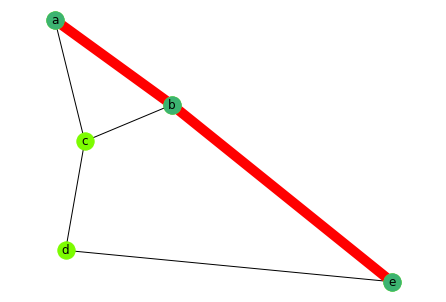

In [0]:
#Programation de graph avec des distance et des temps par dictionaire avec visualisation
#objectif est de resoudre le pb du voyageur de cmmerce
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

G = nx.Graph()
map_dict = [
            {'start': 'a', 'end': 'b', 'length': 5, 'time': 55},
            {'start': 'a', 'end': 'c', 'length': 8, 'time': 125},
            {'start': 'b', 'end': 'c', 'length': 22, 'time': 275},
            {'start': 'c', 'end': 'd', 'length': 16, 'time': 210},
            {'start': 'b', 'end': 'e', 'length': 22, 'time': 14},
            {'start': 'd', 'end': 'e', 'length': 7, 'time': 6}  ]

for pts in map_dict:
    G.add_edge(pts['start'], pts['end'], weight=pts['time'])

# Show the shortest path between points 'a' and 'e'.
path = nx.shortest_path(G, source='a',target='e')
print(path)

path_edges = zip(path, path[1:])
path_edges = set(path_edges)
pos = nx.spring_layout(G)
nx.draw(G, pos, node_color='lawngreen', with_labels = True)
nx.draw_networkx_nodes(G, pos, nodelist=path, node_color='mediumseagreen')
nx.draw_networkx_edges(G, pos, edgelist=path_edges, edge_color='r', width=10)
plt.axis('equal')
plt.show()    

In [2]:
# For a single-input model with 10 classes (categorical classification):
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout

# Generate dummy data
x_train = np.random.random((1000, 20))
y_train = np.random.randint(2, size=(1000, 1))
x_test = np.random.random((100, 20))
y_test = np.random.randint(2, size=(100, 1))

model = Sequential()
model.add(Dense(32, activation='relu', input_dim=100))
model.add(Dense(10, activation='softmax'))
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Generate dummy data
import numpy as np
data = np.random.random((1000, 100))
labels = np.random.randint(10, size=(1000, 1))

# Convert labels to categorical one-hot encoding
one_hot_labels = keras.utils.to_categorical(labels, num_classes=10)

# Train the model, iterating on the data in batches of 32 samples
model.fit(data, one_hot_labels, epochs=10, batch_size=32)

Using TensorFlow backend.


NameError: ignored

In [0]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.layers import Embedding
from keras.layers import LSTM

max_features = 1024

model = Sequential()
model.add(Embedding(max_features, output_dim=256))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

model.fit(x_train, y_train, batch_size=16, epochs=10)
score = model.evaluate(x_test, y_test, batch_size=16)
model.summary()

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/indexed_slices.py:434: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6979 - accuracy: 0.5010
Epoch 2/10
1000/1000 [==============================] - 2s 2ms/step - loss: 0.6989 - accuracy: 0.4920
Epoch 3/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6979 - accuracy: 0.4840
Epoch 4/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6955 - accuracy: 0.4980
Epoch 5/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6937 - accuracy: 0.5080
Epoch 6/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6966 - accuracy: 0.4910
Epoch 7/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6958 - accuracy: 0.5020
Epoch 8/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6958 - accuracy: 0.4890
Epoch 9/10
1000/1000 [==============================] - 3s 3ms/step - loss: 0.6953 - accuracy: 0.5020
Epoch 10/10
100/100 [==============================] - 0s 979us/step
Model: "seque

In [0]:
from keras.layers import Input, Dense
from keras.models import Model

# This returns a tensor
inputs = Input(shape=(784,))

# a layer instance is callable on a tensor, and returns a tensor
output_1 = Dense(64, activation='relu')(inputs)
output_2 = Dense(64, activation='relu')(output_1)
predictions = Dense(10, activation='softmax')(output_2)

# This creates a model that includes
# the Input layer and three Dense layers
model = Model(inputs=inputs, outputs=predictions)
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.fit(data, labels)  # starts training
model.summary()

NameError: ignored

In [10]:
%load_ext tensorboard
import tensorflow as tf
import datetime
# Clear any logs from previous runs
!rm -rf ./logs/

mnist = tf.keras.datasets.mnist

(x_train, y_train),(x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

def create_model():
  return tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation='softmax')
  ])
  

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
11493376/11490434 [==============================] - 0s 0us/step


In [11]:
model = create_model()
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(x=x_train, 
          y=y_train, 
          epochs=5, 
          validation_data=(x_test, y_test), 
          callbacks=[tensorboard_callback])

Epoch 1/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2193 - accuracy: 0.9355 - val_loss: 0.1055 - val_accuracy: 0.9655
Epoch 2/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0980 - accuracy: 0.9701 - val_loss: 0.0794 - val_accuracy: 0.9758
Epoch 3/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0699 - accuracy: 0.9780 - val_loss: 0.0877 - val_accuracy: 0.9719
Epoch 4/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0523 - accuracy: 0.9830 - val_loss: 0.0676 - val_accuracy: 0.9786
Epoch 5/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.0440 - accuracy: 0.9851 - val_loss: 0.0600 - val_accuracy: 0.9814


In [22]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 287), started 4:03:08 ago. (Use '!kill 287' to kill it.)

In [0]:
Exemple de regresion

In [0]:
import tensorflow as tf
import keras as ks
import numpy as np

In [0]:
?np.random

In [0]:
np.random.randn(10)

array([-0.31394583,  1.96064524,  0.90589235,  0.59314404, -0.17378524,
        0.50001418,  0.26957508,  0.09427427,  0.88735481,  1.28445654])

In [0]:
?np.random.normal

In [0]:
[x/1000-500 for x in list(range(-500,500))]

In [0]:
nb_point=5000
band_length=10
var=10
mean=0
error=np.random.normal(mean,var,nb_point)

X1d =[-band_length+x*2*band_length/nb_point for x in list(range(nb_point))]
Y1d = [ (lambda x: 1.5*x**3-5*x**2-50*x+100*np.sin(3.15*x))(X1d[i])  +error[i] for i in list(range(nb_point))]

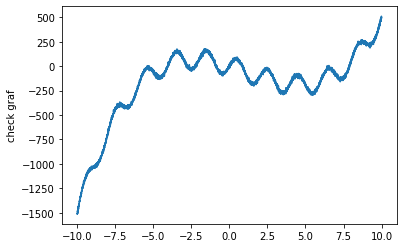

In [0]:
import matplotlib.pyplot as plt
plt.plot(X1d, Y1d)
plt.ylabel('check graf')
plt.show()

In [0]:
import random
rand_list=list(random.sample(list(range(nb_point)),nb_point))          # low=0,high=nb_point, size=int(0.7*nb_point))

X_train=[X1d[i] for i in rand_list[0:(int(0.7*nb_point)-1)]]
Y_train=[Y1d[i] for i in rand_list[0:(int(0.7*nb_point)-1)]]

In [0]:
X_test = [ X1d[j] for j in rand_list[int(0.7*nb_point):-1]]
Y_test = [ Y1d[j] for j in rand_list[int(0.7*nb_point):-1]]

In [0]:
Y_est=[ (lambda x: 1.5*x**3-5*x**2-50*x+100*np.sin(3.15*x))(y)  for y in X_train]
print(Y_train[2]-Y_est[2])
print(X_train[2])
print(Y_est[2])

-8.098301809777325
-4.416
-103.32011192083829


In [0]:
print(len(X_train))
print(len(Y_train))

3499
3499


In [0]:
x=-7.076
print(1.5*x**3-5*x**2-50*x+100*np.sin(3.15*x))

-398.6045546530309


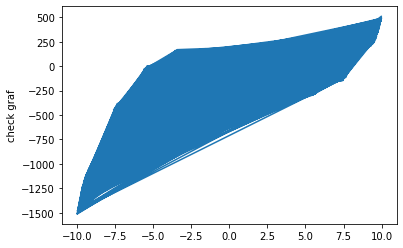

In [0]:
?plt.plot
plt.plot(X_train,Y_train)
plt.ylabel('check graf')
plt.show()

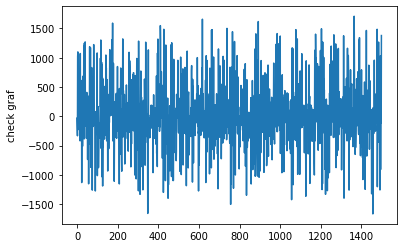

In [0]:
plt.plot([y1-y2 for y1, y2 in zip(Y_test,Y_est)])
plt.ylabel('check graf')
plt.show()

In [0]:
from keras.models import Model, Sequential # Model es functional 
from keras.layers import Input, Dense, Activation, Flatten, Dropout, Convolution1D, ConvLSTM2D, ConvRecurrent2D

Seq_model = Sequential()
Seq_model.add(Dense(8, input_shape(1,), batch_size=50 ))
Seq_model.add(Dense(16))
Seq_model.add(Flatten(16))
Seq_model.add(Dense(32))
model.add(Dropout(0.5))
Seq_model.add(Activation('relu'))
Seq_model.add(Dense(10))
model.add(Dropout(0.5))
Seq_model.add(Activation('softmax'))

#model.compile(optimizer='rmsprop', loss='mse')
model.compile(loss='mean_squared_error',
              optimizer='sgd',
              metrics=['mae', 'acc'])

Seq_model.fit(X_train, Y_train, epochs=10, batch_size=32)

Seq_model.evaluate()

Seq_model.predict()


SyntaxError: ignored

In [0]:
'''
A linear regression learning algorithm example using TensorFlow library.
Author: Aymeric Damien
Project: https://github.com/aymericdamien/TensorFlow-Examples/
'''

from __future__ import print_function

import tensorflow as tf
import numpy
import matplotlib.pyplot as plt
rng = numpy.random

# Parameters
learning_rate = 0.01
training_epochs = 1000
display_step = 50

# Training Data
train_X = numpy.asarray([3.3,4.4,5.5,6.71,6.93,4.168,9.779,6.182,7.59,2.167,
                         7.042,10.791,5.313,7.997,5.654,9.27,3.1])
train_Y = numpy.asarray([1.7,2.76,2.09,3.19,1.694,1.573,3.366,2.596,2.53,1.221,
                         2.827,3.465,1.65,2.904,2.42,2.94,1.3])
n_samples = train_X.shape[0]

# tf Graph Input
X = tf.placeholder("float")
Y = tf.placeholder("float")

# Set model weights
W = tf.Variable(rng.randn(), name="weight")
b = tf.Variable(rng.randn(), name="bias")

# Construct a linear model
pred = tf.add(tf.multiply(X, W), b)

# Mean squared error
cost = tf.reduce_sum(tf.pow(pred-Y, 2))/(2*n_samples)
# Gradient descent
#  Note, minimize() knows to modify W and b because Variable objects are trainable=True by default
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost)

# Initialize the variables (i.e. assign their default value)
init = tf.global_variables_initializer()

# Start training
with tf.Session() as sess:

    # Run the initializer
    sess.run(init)

    # Fit all training data
    for epoch in range(training_epochs):
        for (x, y) in zip(train_X, train_Y):
            sess.run(optimizer, feed_dict={X: x, Y: y})

        # Display logs per epoch step
        if (epoch+1) % display_step == 0:
            c = sess.run(cost, feed_dict={X: train_X, Y:train_Y})
            print("Epoch:", '%04d' % (epoch+1), "cost=", "{:.9f}".format(c), \
                "W=", sess.run(W), "b=", sess.run(b))

    print("Optimization Finished!")
    training_cost = sess.run(cost, feed_dict={X: train_X, Y: train_Y})
    print("Training cost=", training_cost, "W=", sess.run(W), "b=", sess.run(b), '\n')

    # Graphic display
    plt.plot(train_X, train_Y, 'ro', label='Original data')
    plt.plot(train_X, sess.run(W) * train_X + sess.run(b), label='Fitted line')
    plt.legend()
    plt.show()

    # Testing example, as requested (Issue #2)
    test_X = numpy.asarray([6.83, 4.668, 8.9, 7.91, 5.7, 8.7, 3.1, 2.1])
    test_Y = numpy.asarray([1.84, 2.273, 3.2, 2.831, 2.92, 3.24, 1.35, 1.03])

    print("Testing... (Mean square loss Comparison)")
    testing_cost = sess.run(
        tf.reduce_sum(tf.pow(pred - Y, 2)) / (2 * test_X.shape[0]),
        feed_dict={X: test_X, Y: test_Y})  # same function as cost above
    print("Testing cost=", testing_cost)
    print("Absolute mean square loss difference:", abs(
        training_cost - testing_cost))

    plt.plot(test_X, test_Y, 'bo', label='Testing data')
    plt.plot(train_X, sess.run(W) * train_X + sess.run(b), label='Fitted line')
    plt.legend()
    plt.show()


AttributeError: ignored